### import packages

In [1]:
import kagglehub

import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image

import tensorflow as tf

### Read from kaggle

In [2]:


# Download latest version
path = kagglehub.dataset_download("zunorain/tomato-dataset-v2")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\vignesh\.cache\kagglehub\datasets\zunorain\tomato-dataset-v2\versions\1


In [3]:


# Step 1: Check what’s inside the downloaded folder
print("Dataset path:", path)
path = path+'\\augmented_dataset'
print("Contents:", os.listdir(path))

Dataset path: C:\Users\vignesh\.cache\kagglehub\datasets\zunorain\tomato-dataset-v2\versions\1
Contents: ['Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_healthy', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_mosaic_virus', 'Tomato__Tomato_YellowLeaf__Curl_Virus']


In [4]:
classes = os.listdir(path)

In [5]:
classes

['Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_healthy',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato__Target_Spot',
 'Tomato__Tomato_mosaic_virus',
 'Tomato__Tomato_YellowLeaf__Curl_Virus']

### EDA

 #### Show sample images

In [6]:
sample_images_dir = os.path.join(path, 'Tomato_Bacterial_spot')

In [7]:
sample_images = os.listdir(sample_images_dir)[:20]

In [8]:
sample_images

['img_1.jpg',
 'img_10.jpg',
 'img_100.jpg',
 'img_1000.jpg',
 'img_1001.jpg',
 'img_1002.jpg',
 'img_1003.jpg',
 'img_1004.jpg',
 'img_1005.jpg',
 'img_1006.jpg',
 'img_1007.jpg',
 'img_1008.jpg',
 'img_1009.jpg',
 'img_101.jpg',
 'img_1010.jpg',
 'img_1011.jpg',
 'img_1012.jpg',
 'img_1013.jpg',
 'img_1014.jpg',
 'img_1015.jpg']

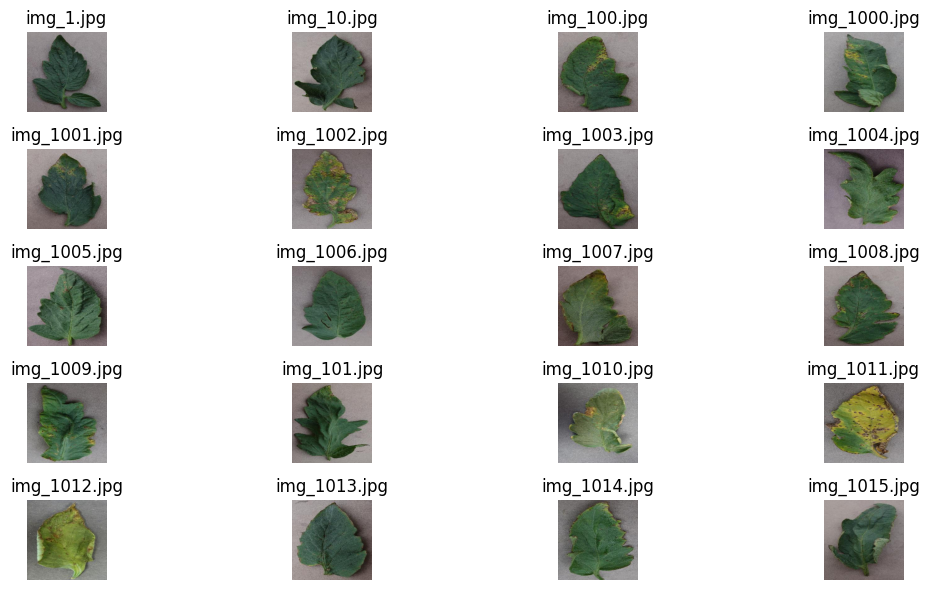

In [9]:
plt.figure(figsize=(12,6))
for i, name in enumerate(sample_images):
    img_dir = os.path.join(sample_images_dir, name)
    img = Image.open(img_dir)
    plt.subplot(5,4, i+1)
    plt.imshow(img)

    plt.title(name)
    plt.axis("off")

plt.tight_layout()
plt.show()

#### image counts

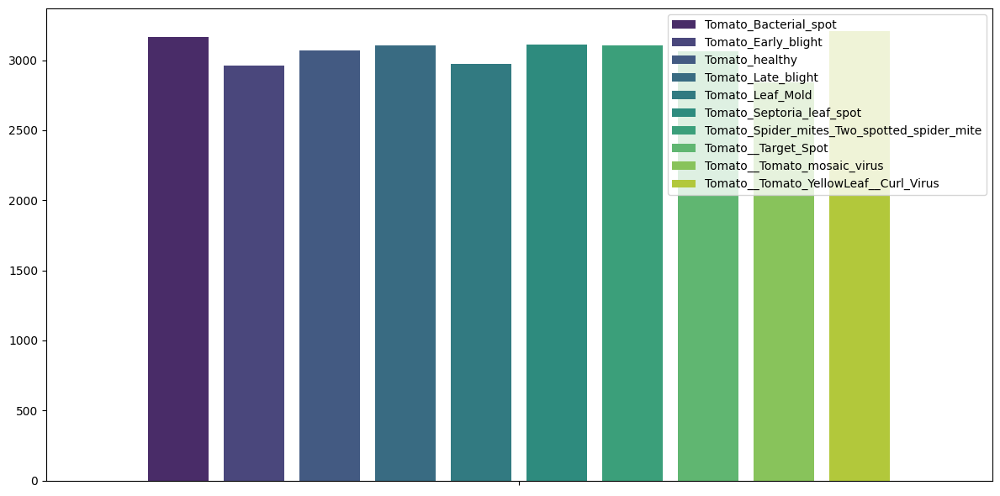

In [10]:
counts = {}
for name in classes:
    p = os.path.join(path, name)
    l = len(os.listdir(p))
    counts[name] = l

plt.figure(figsize=(12,6))
sns.barplot(hue=counts.keys(), y = counts.values(), palette="viridis", gap=0.2)
plt.xticks(rotation=25)
plt.tight_layout()
plt.show()


### Read all image

In [11]:
train_data = tf.keras.utils.image_dataset_from_directory(path, batch_size=32)

Found 30609 files belonging to 10 classes.


In [12]:
class_names = train_data.class_names

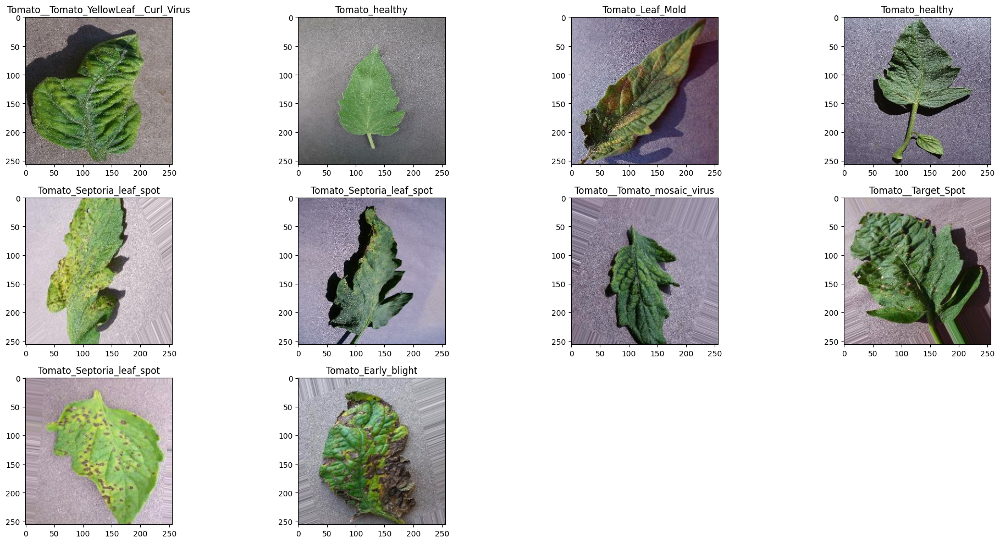

In [13]:
plt.figure(figsize=(20,10))
for img, label in train_data.take(1):
    for i in range(10):
        plt.subplot(3,4, i+1)
        plt.imshow(img[i].numpy().astype("uint8"))
        plt.title(class_names[label[i].numpy()])
    plt.tight_layout()
    plt.show()
        
    

### Train test split

In [14]:
test_size = int(0.2 * len(train_data))

In [15]:
test_data = train_data.take(test_size)
train_data = train_data.skip(test_size)

In [16]:
AUTOTUNE = tf.data.AUTOTUNE

train_data = train_data.cache().shuffle(100).prefetch(buffer_size=AUTOTUNE)
test_data = test_data.cache().prefetch(buffer_size=AUTOTUNE)

### Modeling

In [17]:
train_data.take(1)

<TakeDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [18]:
from keras.models import Sequential # CNN
from keras.layers import Dense, MaxPool2D, Dropout, Flatten, Normalization, Rescaling, Conv2D

from tensorflow.keras.callbacks import EarlyStopping

In [19]:
model = tf.keras.Sequential()

model.add(Rescaling(1./256, input_shape=(256, 256, 3)))
model.add(Conv2D(32, (3,3), 1, activation=tf.keras.activations.relu, padding="same"))
model.add(MaxPool2D())

model.add(Conv2D(64, (3,3), 1, activation=tf.keras.activations.relu, padding="same"))
model.add(MaxPool2D())

# model.add(Conv2D(128, (3,3), 1, activation=tf.keras.activations.relu, padding="same"))
# model.add(MaxPool2)D()

model.add(Flatten())

model.add(Dense(units=32, activation=tf.keras.activations.relu))
# model.add(Dense(units=32, activation=tf.keras.activations.relu))
# model.add(Dense(units=64, activation=tf.keras.activations.relu))
# model.add(Dense(units=64, activation=tf.keras.activations.relu))

model.add(Dropout(0.3))

model.add(Dense(units=len(class_names), activation=tf.keras.activations.softmax))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 262144)            0

In [20]:
model.compile(optimizer=tf.keras.optimizers.SGD(),
             loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

In [21]:
stop = EarlyStopping(monitor='loss', patience=5,
    verbose=1)

In [22]:
model.fit(
    train_data,
    epochs=20,
    callbacks=[stop]
)

Epoch 1/20
766/766 [==============================] - 84s 98ms/step - loss: 2.3004 - accuracy: 0.1074
Epoch 2/20
766/766 [==============================] - 154s 201ms/step - loss: 2.2749 - accuracy: 0.1317
Epoch 3/20
766/766 [==============================] - 172s 224ms/step - loss: 2.1653 - accuracy: 0.1984
Epoch 4/20
766/766 [==============================] - 219s 286ms/step - loss: 1.9328 - accuracy: 0.2885
Epoch 5/20
766/766 [==============================] - 160s 208ms/step - loss: 1.7055 - accuracy: 0.3581
Epoch 6/20
766/766 [==============================] - 123s 161ms/step - loss: 1.4631 - accuracy: 0.4612
Epoch 7/20
766/766 [==============================] - 225s 293ms/step - loss: 1.2815 - accuracy: 0.5376
Epoch 8/20
766/766 [==============================] - 168s 220ms/step - loss: 1.1361 - accuracy: 0.5899
Epoch 9/20
766/766 [==============================] - 157s 205ms/step - loss: 1.0201 - accuracy: 0.6340
Epoch 10/20
766/766 [==============================] - 156s 204ms/

In [23]:
test_loss, test_acc = model.evaluate(test_data)

191/191 [==============================] - 14s 50ms/step - loss: 0.3643 - accuracy: 0.8781


In [24]:
print("test_loss, test_acc : {}".format([test_loss, test_acc]))

test_loss, test_acc : [0.3643125295639038, 0.8781086206436157]


1/1 [==============================] - 1s 780ms/step


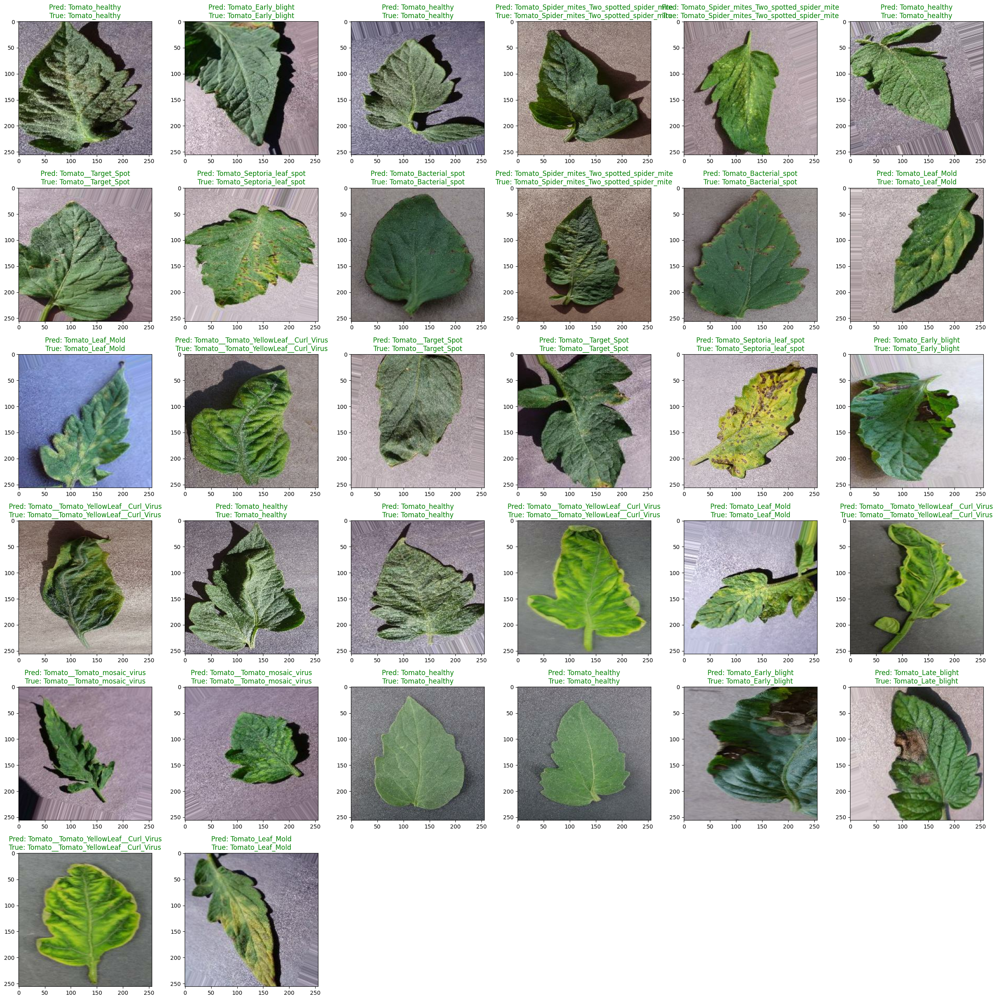

1/1 [==============================] - 0s 56ms/step


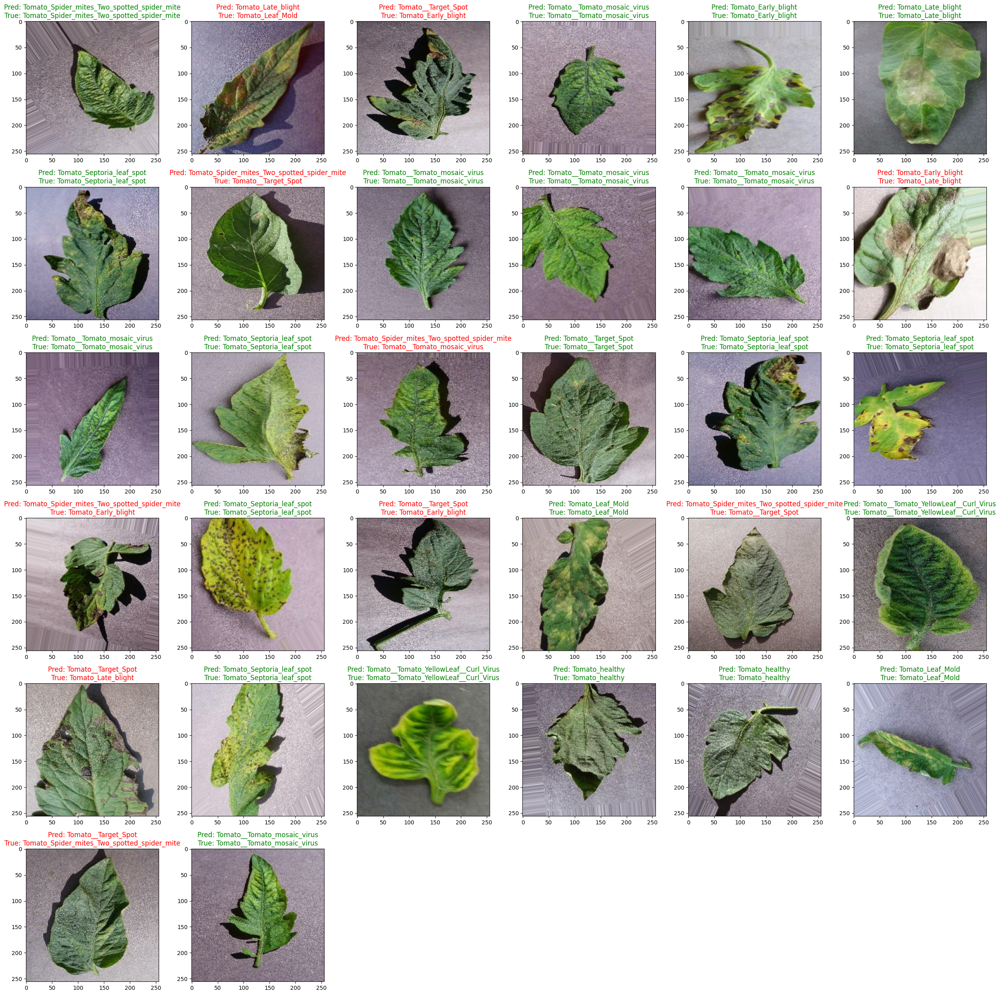

In [25]:
for i in range(1,3):
    for image, cls in test_data.skip(i).take(1):
        true_labels = cls.numpy().astype("uint8")
        predicted_labels = np.argmax(model.predict(image), axis=1)
        plt.figure(figsize=(25,25))
        for i in range(len(image)):
            plt.subplot(6,6, i+1)
            plt.imshow(image[i].numpy().astype('uint8'))
            plt.title(f"Pred: {class_names[predicted_labels[i]]}\nTrue: {class_names[true_labels[i]]}",
                      color="green" if predicted_labels[i] == true_labels[i] else "red")
        plt.tight_layout()
        plt.show()
    

In [26]:
from sklearn.metrics import classification_report, accuracy_score, f1_score

In [27]:
print(f1_score())

TypeError: missing a required argument: 'y_true'